In [1]:
# STEP 1: Install Required Libraries
!pip install keras-cv --quiet

# STEP 2: Upload ZIP Dataset (Folders = Classes)
from google.colab import files
uploaded = files.upload()

import zipfile
import os

for filename in uploaded.keys():
    with zipfile.ZipFile(filename, 'r') as zip_ref:
        zip_ref.extractall("data")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 48.8 MB/s eta 0:00:00


Saving archive.zip to archive.zip


In [ ]:
#strong augmentation with 10 epoch
#72(train)-8(val)-20(test)

# Unzip the dataset
import zipfile
import os

zip_path = '/content/archive.zip'
extract_path = '/content/dataset'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)


#Train-test-validation split
import shutil
from sklearn.model_selection import train_test_split

source_dir = os.path.join(extract_path, 'archive')
base_dir = '/content/data'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

for folder in [train_dir, val_dir, test_dir]:
    os.makedirs(folder, exist_ok=True)

for class_name in os.listdir(source_dir):
    class_path = os.path.join(source_dir, class_name)
    if os.path.isdir(class_path):
        images = os.listdir(class_path)
        train_imgs, test_imgs = train_test_split(images, test_size=0.2, random_state=42)
        train_imgs, val_imgs = train_test_split(train_imgs, test_size=0.1, random_state=42)

        for subfolder, img_list in zip([train_dir, val_dir, test_dir], [train_imgs, val_imgs, test_imgs]):
            class_subfolder = os.path.join(subfolder, class_name)
            os.makedirs(class_subfolder, exist_ok=True)
            for img in img_list:
                shutil.copy(os.path.join(class_path, img), os.path.join(class_subfolder, img))


# Set up data loaders with augmentations
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

# Augmentations for training
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# Validation and Test transforms
eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

train_dataset = datasets.ImageFolder(train_dir, transform=train_transform)
val_dataset = datasets.ImageFolder(val_dir, transform=eval_transform)
test_dataset = datasets.ImageFolder(test_dir, transform=eval_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)



#Load Swin Transformer
import torch.nn as nn
from torchvision.models import swin_t, Swin_T_Weights

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = swin_t(weights=Swin_T_Weights.DEFAULT)
model.head = nn.Linear(model.head.in_features, 6)
model = model.to(device)


#Train the model + Validation
import torch.optim as optim
from sklearn.metrics import accuracy_score

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0
    train_preds, train_labels = [], []

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        train_preds.extend(preds.cpu().numpy())
        train_labels.extend(labels.cpu().numpy())

    train_acc = accuracy_score(train_labels, train_preds)

    # Validation phase
    model.eval()
    val_preds, val_labels = [], []
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            val_preds.extend(preds.cpu().numpy())
            val_labels.extend(labels.cpu().numpy())

    val_acc = accuracy_score(val_labels, val_preds)
    avg_loss = running_loss / len(train_loader)
    scheduler.step()
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

# Evaluate on Test Set
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

test_acc = accuracy_score(all_labels, all_preds)
print(f"\nFinal Test Accuracy: {test_acc:.4f}")


Epoch [1/10], Loss: 1.1588, Train Acc: 0.5469, Val Acc: 0.7381
Epoch [2/10], Loss: 0.8263, Train Acc: 0.6763, Val Acc: 0.7262
Epoch [3/10], Loss: 0.7260, Train Acc: 0.7350, Val Acc: 0.7679
Epoch [4/10], Loss: 0.6355, Train Acc: 0.7519, Val Acc: 0.7500
Epoch [5/10], Loss: 0.6178, Train Acc: 0.7694, Val Acc: 0.7440
Epoch [6/10], Loss: 0.5680, Train Acc: 0.7930, Val Acc: 0.8036
Epoch [7/10], Loss: 0.5198, Train Acc: 0.7970, Val Acc: 0.8452
Epoch [8/10], Loss: 0.5023, Train Acc: 0.8065, Val Acc: 0.8512
Epoch [9/10], Loss: 0.4886, Train Acc: 0.8078, Val Acc: 0.8452
Epoch [10/10], Loss: 0.4858, Train Acc: 0.8098, Val Acc: 0.8690

Final Test Accuracy: 0.8729


In [ ]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 20.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=2e8569ce24fd1b34bac0ae51381d5e56840c91b640b2d4cf07c7980cb376509a
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# === Pick an image from test_dataset ===
index = 262
image_tensor, true_class_idx = test_dataset[index]  # This uses proper transforms + label
input_tensor = image_tensor.unsqueeze(0).to(device)

# Convert back to unnormalized RGB image for visualization
def denormalize(tensor):
    tensor = tensor.clone().cpu().numpy().transpose(1, 2, 0)
    tensor = tensor * 0.5 + 0.5  # Reverse normalization
    return np.clip(tensor, 0, 1)

rgb_img = denormalize(image_tensor)

# === Predict ===
model.eval()
with torch.no_grad():
    outputs = model(input_tensor)
    pred_class_idx = torch.argmax(outputs, dim=1).item()

# === Grad-CAM ===
target_layers = [model.features[3][-1].norm1]
with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(pred_class_idx)])[0]
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

# === Show results ===
class_names = test_dataset.classes
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(rgb_img)
plt.title(f"Original\nTrue: {class_names[true_class_idx]}")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(visualization)
title = f"Grad-CAM\nPredicted: {class_names[pred_class_idx]}"
if pred_class_idx != true_class_idx:
    title += "No"
else:
    title += "Yes"
plt.title(title)
plt.axis('off')
plt.tight_layout()
plt.show()


AttributeError: 'MLP' object has no attribute 'fc2'

Epoch 1/10, Loss: 1.0858, Train Acc: 0.5947, Val Acc: 0.7440
Epoch 2/10, Loss: 0.7202, Train Acc: 0.7242, Val Acc: 0.8274
Epoch 3/10, Loss: 0.5859, Train Acc: 0.7694, Val Acc: 0.7381
Epoch 4/10, Loss: 0.6024, Train Acc: 0.7748, Val Acc: 0.7976
Epoch 5/10, Loss: 0.5393, Train Acc: 0.7910, Val Acc: 0.8393
Epoch 6/10, Loss: 0.5116, Train Acc: 0.8018, Val Acc: 0.8571
Epoch 7/10, Loss: 0.4119, Train Acc: 0.8314, Val Acc: 0.8333
Epoch 8/10, Loss: 0.4355, Train Acc: 0.8254, Val Acc: 0.8631
Epoch 9/10, Loss: 0.3856, Train Acc: 0.8469, Val Acc: 0.8631
Epoch 10/10, Loss: 0.3710, Train Acc: 0.8537, Val Acc: 0.7679
🔍 Analyzing Sample Test Images...

Analyzing: (292).jpg


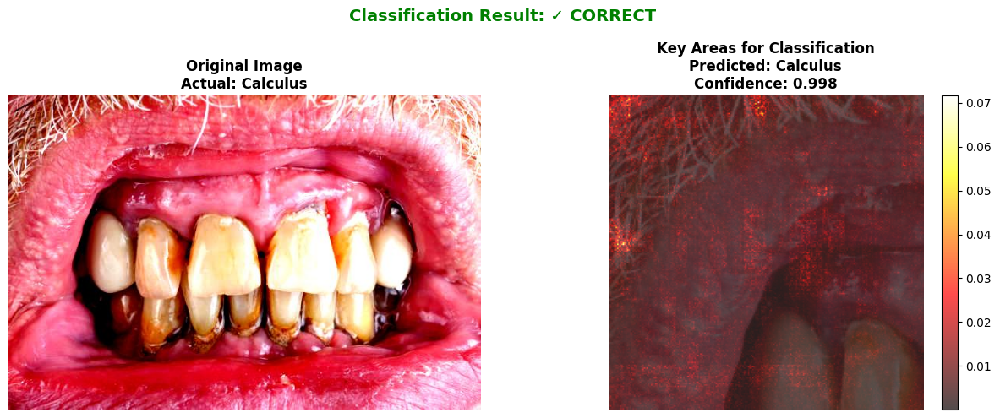

Actual: Calculus | Predicted: Calculus | Confidence: 0.998 | ✓

Analyzing: (269).jpg


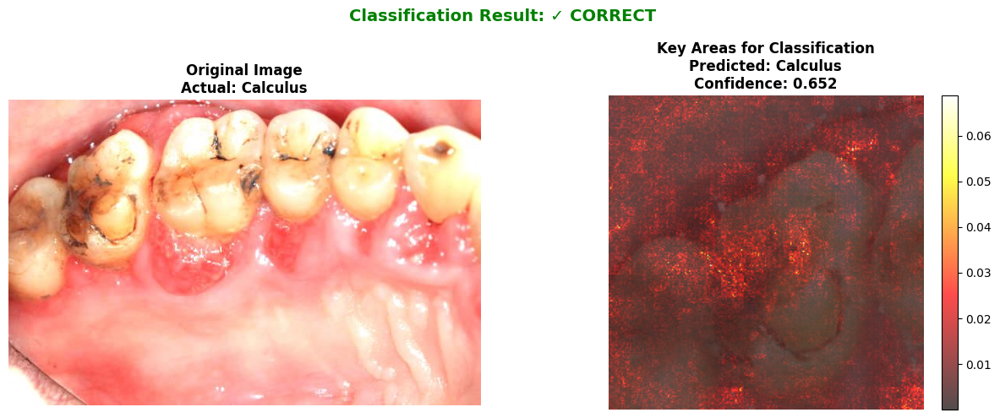

Actual: Calculus | Predicted: Calculus | Confidence: 0.652 | ✓

Analyzing: 83.jpg


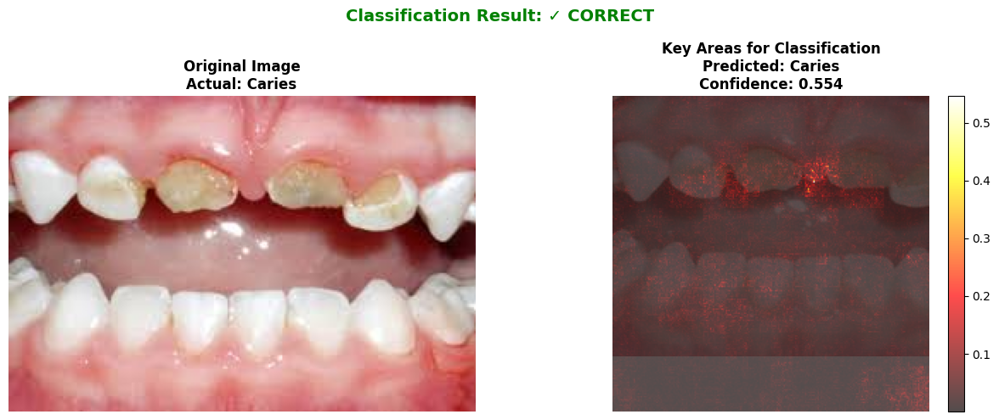

Actual: Caries | Predicted: Caries | Confidence: 0.554 | ✓

Analyzing: 123.jpg


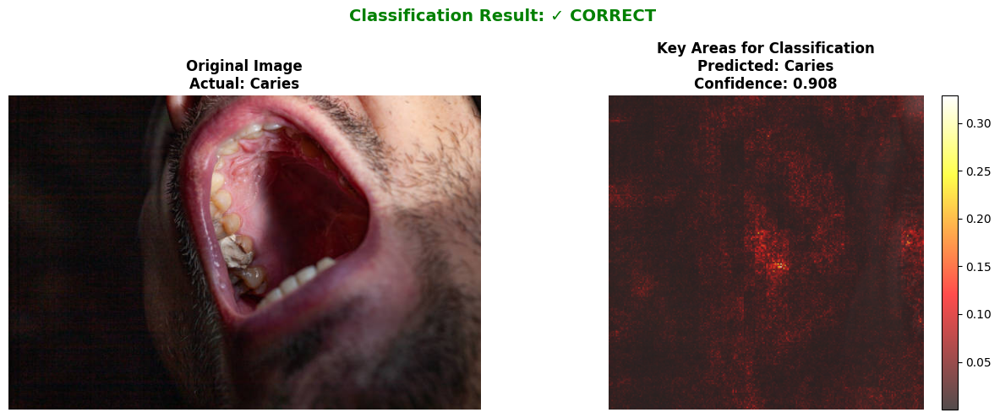

Actual: Caries | Predicted: Caries | Confidence: 0.908 | ✓

Analyzing: (292).jpg


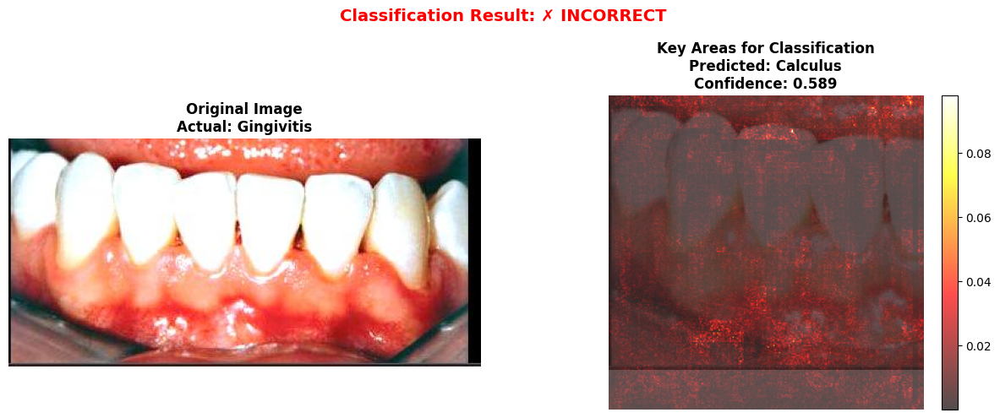

Actual: Gingivitis | Predicted: Calculus | Confidence: 0.589 | ✗

Analyzing: (180).jpg


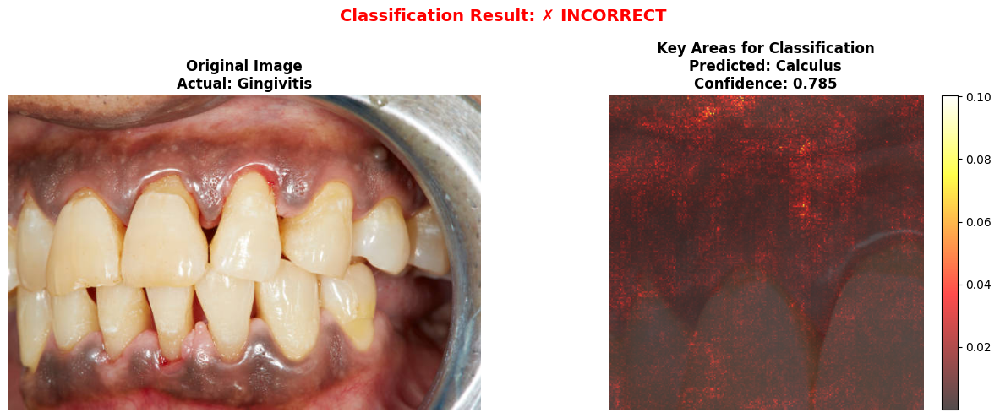

Actual: Gingivitis | Predicted: Calculus | Confidence: 0.785 | ✗

📊 Sample Analysis Results:
Accuracy: 0.667 (4/6)
Classes: Calculus, Caries, Gingivitis, MouthUlcer, hypodontia, tooth_discoloration


In [ ]:
import zipfile
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
from torchvision.models import swin_t, Swin_T_Weights
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from PIL import Image

# Dataset setup
zip_path = '/content/archive.zip'
extract_path = '/content/dataset'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Train-test-validation split
source_dir = os.path.join(extract_path, 'archive')
base_dir = '/content/data'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

for folder in [train_dir, val_dir, test_dir]:
    os.makedirs(folder, exist_ok=True)

for class_name in os.listdir(source_dir):
    class_path = os.path.join(source_dir, class_name)
    if os.path.isdir(class_path):
        images = os.listdir(class_path)
        train_imgs, test_imgs = train_test_split(images, test_size=0.2, random_state=42)
        train_imgs, val_imgs = train_test_split(train_imgs, test_size=0.1, random_state=42)

        for subfolder, img_list in zip([train_dir, val_dir, test_dir], [train_imgs, val_imgs, test_imgs]):
            class_subfolder = os.path.join(subfolder, class_name)
            os.makedirs(class_subfolder, exist_ok=True)
            for img in img_list:
                shutil.copy(os.path.join(class_path, img), os.path.join(class_subfolder, img))

# Data transforms
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

train_dataset = datasets.ImageFolder(train_dir, transform=train_transform)
val_dataset = datasets.ImageFolder(val_dir, transform=eval_transform)
test_dataset = datasets.ImageFolder(test_dir, transform=eval_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Model setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = swin_t(weights=Swin_T_Weights.DEFAULT)
model.head = nn.Linear(model.head.in_features, len(train_dataset.classes))
model = model.to(device)

# Training
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0
    train_preds, train_labels = [], []

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        train_preds.extend(preds.cpu().numpy())
        train_labels.extend(labels.cpu().numpy())

    # Validation
    model.eval()
    val_preds, val_labels = [], []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            val_preds.extend(preds.cpu().numpy())
            val_labels.extend(labels.cpu().numpy())

    train_acc = accuracy_score(train_labels, train_preds)
    val_acc = accuracy_score(val_labels, val_preds)
    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader):.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

# Simple XAI Class
class SimpleXAI:
    def __init__(self, model, device, class_names):
        self.model = model
        self.device = device
        self.class_names = class_names
        self.model.eval()

    def get_activation_map(self, image_tensor, actual_class=None):
        """Get gradient-based activation map"""
        image_tensor = image_tensor.clone().detach().requires_grad_(True)

        # Forward pass
        output = self.model(image_tensor)
        predicted_class = output.argmax(dim=1).item()
        confidence = torch.softmax(output, dim=1)[0, predicted_class].item()

        # Backward pass
        target_score = output[0, predicted_class]
        target_score.backward()

        # Get gradients
        gradients = image_tensor.grad.data.abs().mean(dim=1).squeeze()

        return gradients, predicted_class, confidence, actual_class

    def visualize_prediction(self, image_path, actual_class_name=None):
        """Create simple visualization with original image and activation map"""
        # Load image
        image = Image.open(image_path).convert('RGB')
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
        image_tensor = transform(image).unsqueeze(0).to(self.device)

        # Get actual class from path if not provided
        if actual_class_name is None:
            actual_class_name = os.path.basename(os.path.dirname(image_path))

        # Get activation map
        activation_map, pred_class, confidence, _ = self.get_activation_map(image_tensor, actual_class_name)
        predicted_class_name = self.class_names[pred_class]

        # Create visualization
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

        # Original image
        ax1.imshow(image)
        ax1.set_title(f'Original Image\nActual: {actual_class_name}', fontsize=12, fontweight='bold')
        ax1.axis('off')

        # Activation map overlay
        ax2.imshow(image, alpha=0.6)
        heatmap = ax2.imshow(activation_map.cpu().numpy(), cmap='hot', alpha=0.7)
        ax2.set_title(f'Key Areas for Classification\nPredicted: {predicted_class_name}\nConfidence: {confidence:.3f}',
                     fontsize=12, fontweight='bold')
        ax2.axis('off')

        # Add colorbar
        plt.colorbar(heatmap, ax=ax2, fraction=0.046, pad=0.04)

        # Add correctness indicator
        is_correct = actual_class_name == predicted_class_name
        color = 'green' if is_correct else 'red'
        status = '✓ CORRECT' if is_correct else '✗ INCORRECT'

        fig.suptitle(f'Classification Result: {status}',
                    fontsize=14, fontweight='bold', color=color)

        plt.tight_layout()
        plt.show()

        return predicted_class_name, confidence, is_correct

# Initialize XAI
class_names = train_dataset.classes
xai = SimpleXAI(model, device, class_names)

# Test on sample images
def run_analysis():
    # Get test images with their actual classes
    test_samples = []
    for class_name in class_names[:5]:  # Test first 3 classes
        class_path = os.path.join(test_dir, class_name)
        if os.path.exists(class_path):
            images = os.listdir(class_path)[:2]  # 2 images per class
            for img in images:
                test_samples.append((os.path.join(class_path, img), class_name))

    print("🔍 Analyzing Sample Test Images...")
    print("="*50)

    correct_predictions = 0
    total_predictions = 0

    for image_path, actual_class in test_samples:
        print(f"\nAnalyzing: {os.path.basename(image_path)}")
        predicted_class, confidence, is_correct = xai.visualize_prediction(image_path, actual_class)

        if is_correct:
            correct_predictions += 1
        total_predictions += 1

        print(f"Actual: {actual_class} | Predicted: {predicted_class} | Confidence: {confidence:.3f} | {'✓' if is_correct else '✗'}")

    accuracy = correct_predictions / total_predictions
    print(f"\n📊 Sample Analysis Results:")
    print(f"Accuracy: {accuracy:.3f} ({correct_predictions}/{total_predictions})")
    print(f"Classes: {', '.join(class_names)}")

# Run the analysis
if __name__ == "__main__":
    run_analysis()

Downloading: "https://download.pytorch.org/models/swin_t-704ceda3.pth" to /root/.cache/torch/hub/checkpoints/swin_t-704ceda3.pth
100%|██████████| 108M/108M [00:00<00:00, 128MB/s] 


Epoch 1/10, Loss: 0.8454, Train Acc: 0.6643, Val Acc: 0.7002
Epoch 2/10, Loss: 0.5978, Train Acc: 0.7608, Val Acc: 0.7584
Epoch 3/10, Loss: 0.5379, Train Acc: 0.7758, Val Acc: 0.7360
Epoch 4/10, Loss: 0.4831, Train Acc: 0.8007, Val Acc: 0.7852
Epoch 5/10, Loss: 0.4473, Train Acc: 0.8133, Val Acc: 0.7539
Epoch 6/10, Loss: 0.4140, Train Acc: 0.8270, Val Acc: 0.7919
Epoch 7/10, Loss: 0.3920, Train Acc: 0.8353, Val Acc: 0.7785
Epoch 8/10, Loss: 0.3861, Train Acc: 0.8337, Val Acc: 0.8098
Epoch 9/10, Loss: 0.3662, Train Acc: 0.8360, Val Acc: 0.7673
Epoch 10/10, Loss: 0.3568, Train Acc: 0.8442, Val Acc: 0.7942
🔍 Analyzing Sample Test Images...

Analyzing: (299).jpg


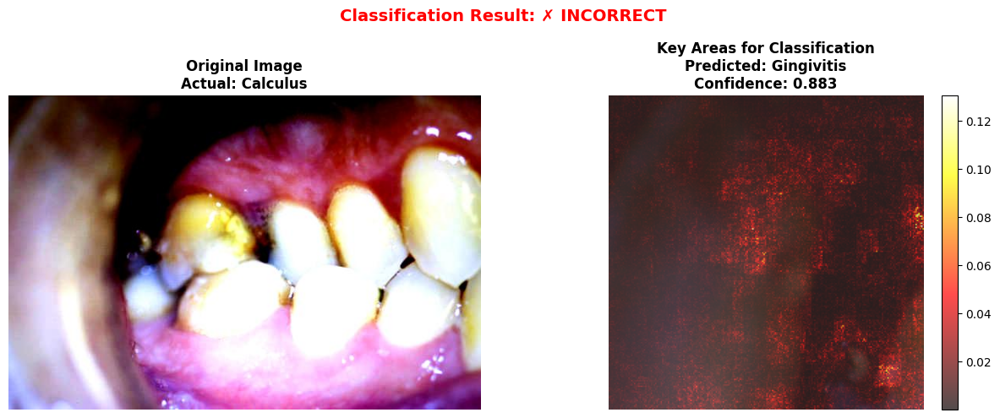

Actual: Calculus | Predicted: Gingivitis | Confidence: 0.883 | ✗

Analyzing: (156).jpg


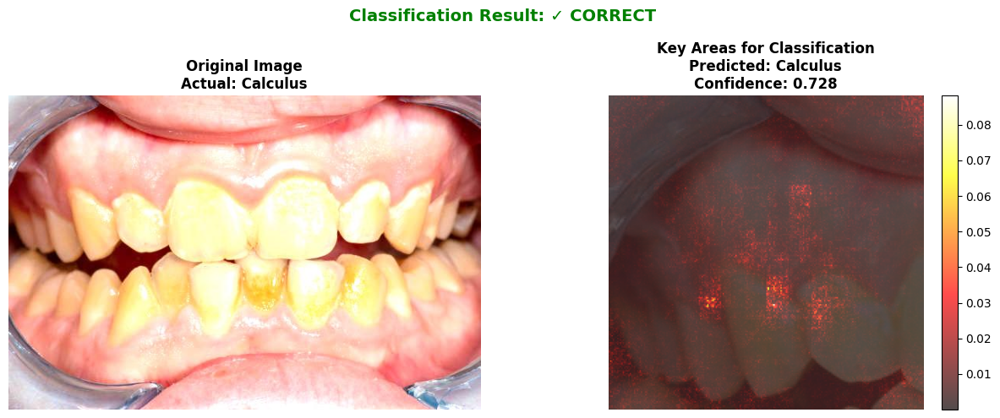

Actual: Calculus | Predicted: Calculus | Confidence: 0.728 | ✓

Analyzing: 19.jpg


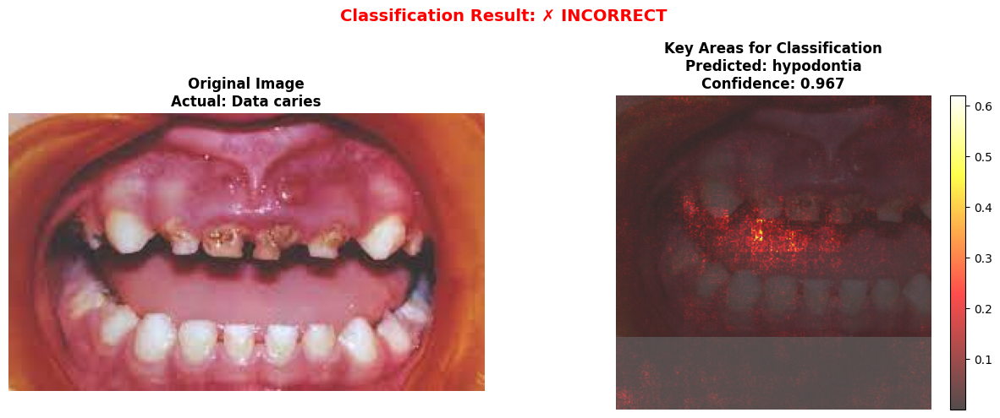

Actual: Data caries | Predicted: hypodontia | Confidence: 0.967 | ✗

Analyzing: 207.jpg


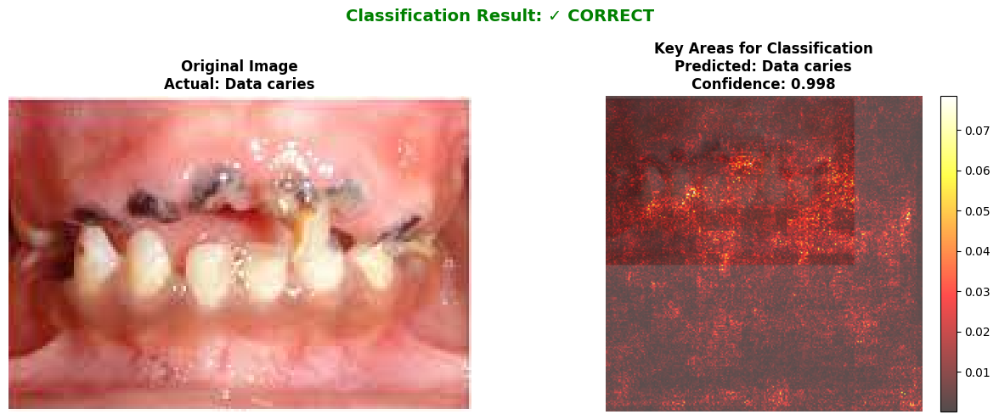

Actual: Data caries | Predicted: Data caries | Confidence: 0.998 | ✓

Analyzing: (1231).jpg


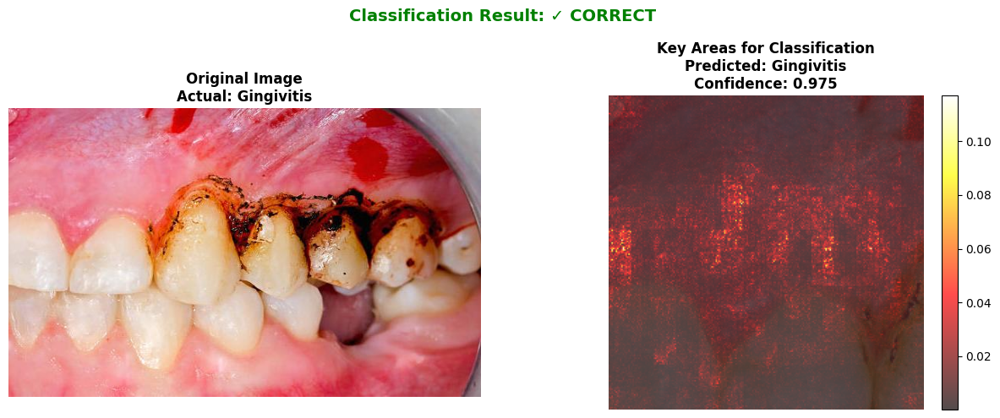

Actual: Gingivitis | Predicted: Gingivitis | Confidence: 0.975 | ✓

Analyzing: (931).jpg


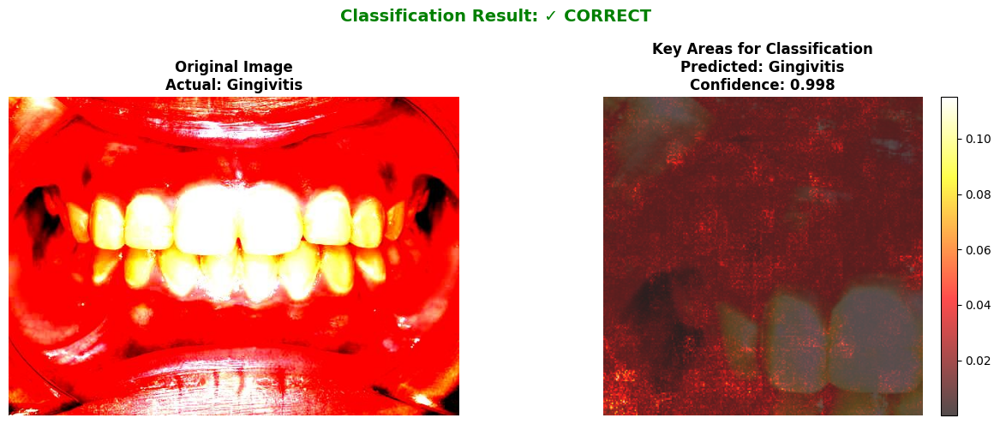

Actual: Gingivitis | Predicted: Gingivitis | Confidence: 0.998 | ✓

Analyzing: 124.jpg


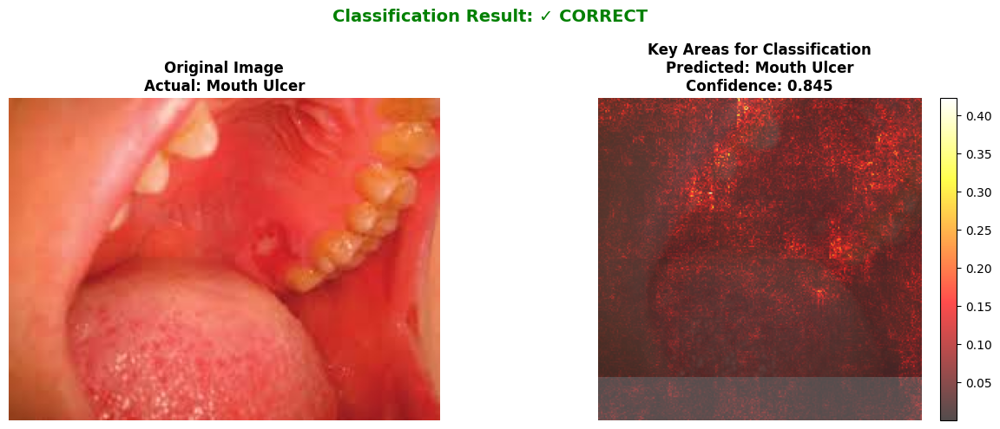

Actual: Mouth Ulcer | Predicted: Mouth Ulcer | Confidence: 0.845 | ✓

Analyzing: 42.jpg


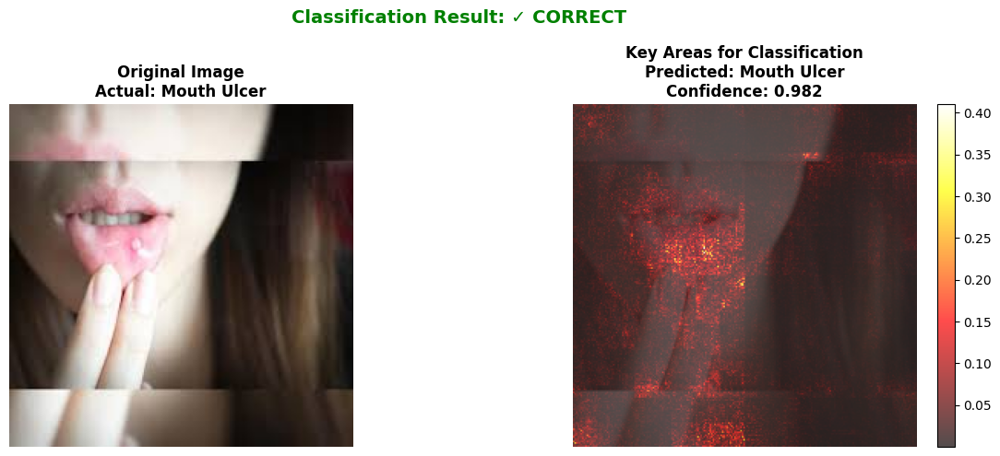

Actual: Mouth Ulcer | Predicted: Mouth Ulcer | Confidence: 0.982 | ✓

Analyzing: 19.jpg


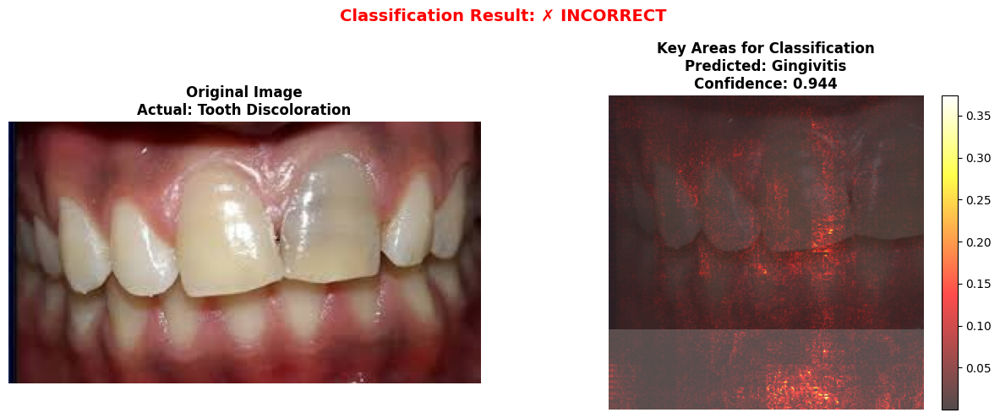

Actual: Tooth Discoloration | Predicted: Gingivitis | Confidence: 0.944 | ✗

Analyzing: 26.jpg


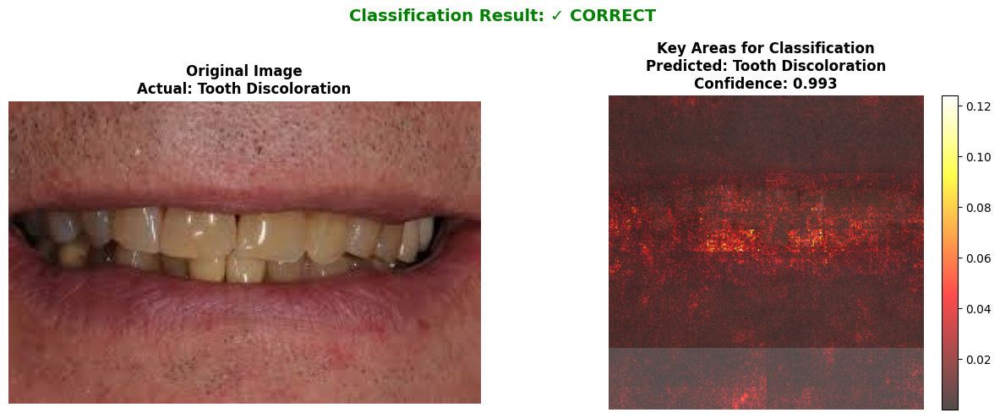

Actual: Tooth Discoloration | Predicted: Tooth Discoloration | Confidence: 0.993 | ✓

📊 Sample Analysis Results:
Accuracy: 0.700 (7/10)
Classes: Calculus, Data caries, Gingivitis, Mouth Ulcer, Tooth Discoloration, hypodontia


In [2]:
import zipfile
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
from torchvision.models import swin_t, Swin_T_Weights
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from PIL import Image

# Dataset setup
zip_path = '/content/archive.zip'
extract_path = '/content/dataset'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Train-test-validation split
source_dir = os.path.join(extract_path, 'archive')
base_dir = '/content/data'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

for folder in [train_dir, val_dir, test_dir]:
    os.makedirs(folder, exist_ok=True)

for class_name in os.listdir(source_dir):
    class_path = os.path.join(source_dir, class_name)
    if os.path.isdir(class_path):
        images = os.listdir(class_path)
        train_imgs, test_imgs = train_test_split(images, test_size=0.2, random_state=42)
        train_imgs, val_imgs = train_test_split(train_imgs, test_size=0.1, random_state=42)

        for subfolder, img_list in zip([train_dir, val_dir, test_dir], [train_imgs, val_imgs, test_imgs]):
            class_subfolder = os.path.join(subfolder, class_name)
            os.makedirs(class_subfolder, exist_ok=True)
            for img in img_list:
                shutil.copy(os.path.join(class_path, img), os.path.join(class_subfolder, img))

# Data transforms
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

train_dataset = datasets.ImageFolder(train_dir, transform=train_transform)
val_dataset = datasets.ImageFolder(val_dir, transform=eval_transform)
test_dataset = datasets.ImageFolder(test_dir, transform=eval_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Model setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = swin_t(weights=Swin_T_Weights.DEFAULT)
model.head = nn.Linear(model.head.in_features, len(train_dataset.classes))
model = model.to(device)

# Training
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0
    train_preds, train_labels = [], []

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        train_preds.extend(preds.cpu().numpy())
        train_labels.extend(labels.cpu().numpy())

    # Validation
    model.eval()
    val_preds, val_labels = [], []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            val_preds.extend(preds.cpu().numpy())
            val_labels.extend(labels.cpu().numpy())

    train_acc = accuracy_score(train_labels, train_preds)
    val_acc = accuracy_score(val_labels, val_preds)
    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader):.4f}, Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

# Simple XAI Class
class SimpleXAI:
    def __init__(self, model, device, class_names):
        self.model = model
        self.device = device
        self.class_names = class_names
        self.model.eval()

    def get_activation_map(self, image_tensor, actual_class=None):
        """Get gradient-based activation map"""
        image_tensor = image_tensor.clone().detach().requires_grad_(True)

        # Forward pass
        output = self.model(image_tensor)
        predicted_class = output.argmax(dim=1).item()
        confidence = torch.softmax(output, dim=1)[0, predicted_class].item()

        # Backward pass
        target_score = output[0, predicted_class]
        target_score.backward()

        # Get gradients
        gradients = image_tensor.grad.data.abs().mean(dim=1).squeeze()

        return gradients, predicted_class, confidence, actual_class

    def visualize_prediction(self, image_path, actual_class_name=None):
        """Create simple visualization with original image and activation map"""
        # Load image
        image = Image.open(image_path).convert('RGB')
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
        image_tensor = transform(image).unsqueeze(0).to(self.device)

        # Get actual class from path if not provided
        if actual_class_name is None:
            actual_class_name = os.path.basename(os.path.dirname(image_path))

        # Get activation map
        activation_map, pred_class, confidence, _ = self.get_activation_map(image_tensor, actual_class_name)
        predicted_class_name = self.class_names[pred_class]

        # Create visualization
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

        # Original image
        ax1.imshow(image)
        ax1.set_title(f'Original Image\nActual: {actual_class_name}', fontsize=12, fontweight='bold')
        ax1.axis('off')

        # Activation map overlay
        ax2.imshow(image, alpha=0.6)
        heatmap = ax2.imshow(activation_map.cpu().numpy(), cmap='hot', alpha=0.7)
        ax2.set_title(f'Key Areas for Classification\nPredicted: {predicted_class_name}\nConfidence: {confidence:.3f}',
                     fontsize=12, fontweight='bold')
        ax2.axis('off')

        # Add colorbar
        plt.colorbar(heatmap, ax=ax2, fraction=0.046, pad=0.04)

        # Add correctness indicator
        is_correct = actual_class_name == predicted_class_name
        color = 'green' if is_correct else 'red'
        status = '✓ CORRECT' if is_correct else '✗ INCORRECT'

        fig.suptitle(f'Classification Result: {status}',
                    fontsize=14, fontweight='bold', color=color)

        plt.tight_layout()
        plt.show()

        return predicted_class_name, confidence, is_correct

# Initialize XAI
class_names = train_dataset.classes
xai = SimpleXAI(model, device, class_names)

# Test on sample images
def run_analysis():
    # Get test images with their actual classes
    test_samples = []
    for class_name in class_names[:5]:  # Test first 3 classes
        class_path = os.path.join(test_dir, class_name)
        if os.path.exists(class_path):
            images = os.listdir(class_path)[:2]  # 2 images per class
            for img in images:
                test_samples.append((os.path.join(class_path, img), class_name))

    print("🔍 Analyzing Sample Test Images...")
    print("="*50)

    correct_predictions = 0
    total_predictions = 0

    for image_path, actual_class in test_samples:
        print(f"\nAnalyzing: {os.path.basename(image_path)}")
        predicted_class, confidence, is_correct = xai.visualize_prediction(image_path, actual_class)

        if is_correct:
            correct_predictions += 1
        total_predictions += 1

        print(f"Actual: {actual_class} | Predicted: {predicted_class} | Confidence: {confidence:.3f} | {'✓' if is_correct else '✗'}")

    accuracy = correct_predictions / total_predictions
    print(f"\n📊 Sample Analysis Results:")
    print(f"Accuracy: {accuracy:.3f} ({correct_predictions}/{total_predictions})")
    print(f"Classes: {', '.join(class_names)}")

# Run the analysis
if __name__ == "__main__":
    run_analysis()

In [ ]:
!pip install lime scikit-image

In [ ]:
from torchvision import datasets
from torchvision import transforms

# === Define transform (should match your eval transform) ===
eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# === Load test dataset ===
test_dir = "/content/data/test"  # change this if needed
test_dataset = datasets.ImageFolder(test_dir, transform=eval_transform)

# === Get class names ===
class_names = test_dataset.classes

# === Print index, image path, and class name ===
for idx, (img_path, class_idx) in enumerate(test_dataset.samples):
    print(f"Index: {idx}, Path: {img_path}, Class Name: {class_names[class_idx]}")


Index: 0, Path: /content/data/test/Calculus/(103).jpg, Class Name: Calculus
Index: 1, Path: /content/data/test/Calculus/(116).jpg, Class Name: Calculus
Index: 2, Path: /content/data/test/Calculus/(117).jpg, Class Name: Calculus
Index: 3, Path: /content/data/test/Calculus/(12).jpg, Class Name: Calculus
Index: 4, Path: /content/data/test/Calculus/(120).jpg, Class Name: Calculus
Index: 5, Path: /content/data/test/Calculus/(121).jpg, Class Name: Calculus
Index: 6, Path: /content/data/test/Calculus/(124).jpg, Class Name: Calculus
Index: 7, Path: /content/data/test/Calculus/(131).jpg, Class Name: Calculus
Index: 8, Path: /content/data/test/Calculus/(134).jpg, Class Name: Calculus
Index: 9, Path: /content/data/test/Calculus/(142).jpg, Class Name: Calculus
Index: 10, Path: /content/data/test/Calculus/(143).jpg, Class Name: Calculus
Index: 11, Path: /content/data/test/Calculus/(169).jpg, Class Name: Calculus
Index: 12, Path: /content/data/test/Calculus/(17).jpg, Class Name: Calculus
Index: 13, 

In [ ]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import timm
import time

# ✅ Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ✅ Image Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# ✅ Dataset (replace with your actual paths)
train_dataset = datasets.ImageFolder(root='data/train', transform=transform)
val_dataset = datasets.ImageFolder(root='data/val', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)

# ✅ Number of classes
num_classes = len(train_dataset.classes)

# ✅ Simple CNN Model
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 28 * 28, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

# ✅ Model dictionary
model_dict = {
    "SimpleCNN": SimpleCNN(num_classes),
    "ResNet50": models.resnet50(pretrained=True),
    "EfficientNet_B0": timm.create_model('efficientnet_b0', pretrained=True),
    "DenseNet121": models.densenet121(pretrained=True),
    "MobileNetV2": models.mobilenet_v2(pretrained=True)
}

# ✅ Modify classifier
def modify_model(model, model_name):
    if model_name == "SimpleCNN":
        return model
    if 'resnet' in model_name.lower():
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif 'densenet' in model_name.lower():
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
    elif 'mobilenet' in model_name.lower():
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    elif 'efficientnet' in model_name.lower():
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)
    else:
        raise NotImplementedError(f"Model head not defined for {model_name}")
    return model

# ✅ Training + evaluation
def train_and_evaluate(model, name):
    model = modify_model(model, name)
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    print(f"\nTraining {name}")
    for epoch in range(5):  # Set to higher for real training
        model.train()
        running_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f"Epoch [{epoch+1}] Loss: {running_loss / len(train_loader):.4f}")

    # Evaluation
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    acc = 100 * correct / total
    print(f"{name} Validation Accuracy: {acc:.2f}%")
    return acc

# ✅ Run all models
accuracies = {}
for name, model in model_dict.items():
    acc = train_and_evaluate(model, name)
    accuracies[name] = acc

# ✅ Summary
print("\n=== Final Accuracy Comparison ===")
for name, acc in accuracies.items():
    print(f"{name}: {acc:.2f}%")



Training SimpleCNN
Epoch [1] Loss: 1.5163
Epoch [2] Loss: 1.1651
Epoch [3] Loss: 0.9552
Epoch [4] Loss: 0.8307
Epoch [5] Loss: 0.7471
SimpleCNN Validation Accuracy: 70.83%

Training ResNet50
Epoch [1] Loss: 0.8442
Epoch [2] Loss: 0.3972
Epoch [3] Loss: 0.2666
Epoch [4] Loss: 0.2111
Epoch [5] Loss: 0.2007
ResNet50 Validation Accuracy: 90.48%

Training EfficientNet_B0
Epoch [1] Loss: 1.3289
Epoch [2] Loss: 0.6705
Epoch [3] Loss: 0.4181
Epoch [4] Loss: 0.2841
Epoch [5] Loss: 0.2442
EfficientNet_B0 Validation Accuracy: 85.71%

Training DenseNet121
Epoch [1] Loss: 1.0299
Epoch [2] Loss: 0.4251
Epoch [3] Loss: 0.2848
Epoch [4] Loss: 0.2215
Epoch [5] Loss: 0.2102
DenseNet121 Validation Accuracy: 89.29%

Training MobileNetV2
Epoch [1] Loss: 0.9779
Epoch [2] Loss: 0.4877
Epoch [3] Loss: 0.3288
Epoch [4] Loss: 0.2449
Epoch [5] Loss: 0.2197
MobileNetV2 Validation Accuracy: 86.90%

=== Final Accuracy Comparison ===
SimpleCNN: 70.83%
ResNet50: 90.48%
EfficientNet_B0: 85.71%
DenseNet121: 89.29%
Mob

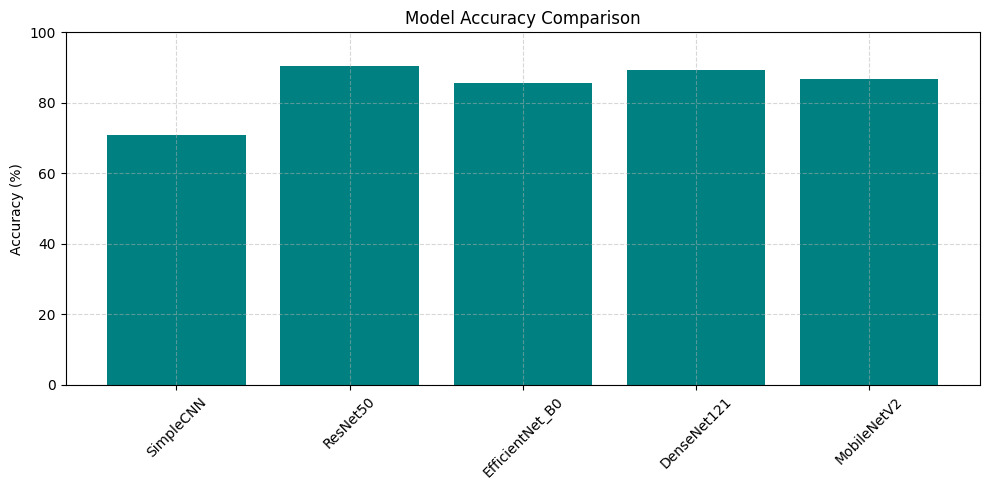

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.bar(accuracies.keys(), accuracies.values(), color='teal')
plt.ylabel('Accuracy (%)')
plt.title('Model Accuracy Comparison')
plt.xticks(rotation=45)
plt.ylim(0, 100)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


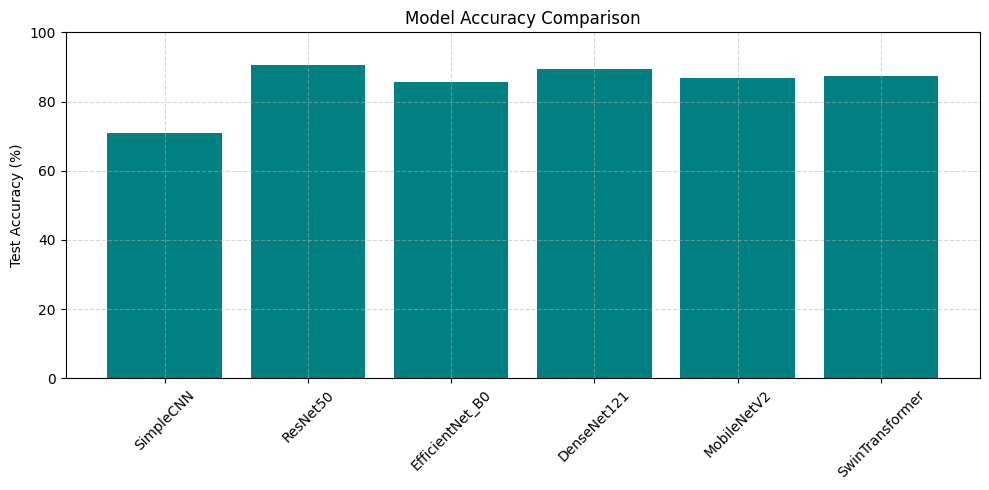


Classification Report:
                     precision    recall  f1-score   support

           Calculus       0.76      0.81      0.79        81
             Caries       0.78      0.86      0.82        44
         Gingivitis       0.83      0.76      0.79       101
         MouthUlcer       1.00      0.98      0.99        53
         hypodontia       0.97      0.99      0.98       101
tooth_discoloration       0.94      0.84      0.89        37

           accuracy                           0.87       417
          macro avg       0.88      0.87      0.88       417
       weighted avg       0.88      0.87      0.87       417



In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

swin_accuracy = test_acc * 100  # From your Swin test accuracy
accuracies["SwinTransformer"] = swin_accuracy

# ---- 2. Bar Plot: Accuracy Comparison ----
def plot_accuracy_bar(accuracies_dict):
    plt.figure(figsize=(10, 5))
    plt.bar(accuracies_dict.keys(), accuracies_dict.values(), color='teal')
    plt.ylabel('Test Accuracy (%)')
    plt.title('Model Accuracy Comparison')
    plt.xticks(rotation=45)
    plt.ylim(0, 100)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

plot_accuracy_bar(accuracies)

# # ---- 3. Line Plot: Swin Training vs Validation Accuracy ----
# def plot_swin_accuracy(train_acc_history, val_acc_history):
#     plt.figure(figsize=(8, 5))
#     plt.plot(range(1, len(train_acc_history)+1), train_acc_history, label='Train Accuracy')
#     plt.plot(range(1, len(val_acc_history)+1), val_acc_history, label='Validation Accuracy')
#     plt.xlabel('Epoch')
#     plt.ylabel('Accuracy')
#     plt.title('Swin Transformer: Training vs Validation Accuracy')
#     plt.legend()
#     plt.grid(True, linestyle='--', alpha=0.5)
#     plt.tight_layout()
#     plt.show()


def show_classification_report(y_true, y_pred, class_names):
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names))

show_classification_report(all_labels, all_preds, test_dataset.classes)
